In [2]:
## importing necessary libraries

import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import t
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import copy
import os
from google.colab import files

In [3]:
uploaded = files.upload()

Saving delhivery_data.csv to delhivery_data.csv


In [5]:
df = pd.read_csv('delhivery_data.csv')

In [6]:
df.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


In [7]:
# Checking for Null Values and discovering data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            144867 non-null  object 
 1   trip_creation_time              144867 non-null  object 
 2   route_schedule_uuid             144867 non-null  object 
 3   route_type                      144867 non-null  object 
 4   trip_uuid                       144867 non-null  object 
 5   source_center                   144867 non-null  object 
 6   source_name                     144574 non-null  object 
 7   destination_center              144867 non-null  object 
 8   destination_name                144606 non-null  object 
 9   od_start_time                   144867 non-null  object 
 10  od_end_time                     144867 non-null  object 
 11  start_scan_to_end_scan          144867 non-null  float64
 12  is_cutoff       

In [8]:
# Checking for Null Values and discovering data types
df.isnull().sum()

data                                0
trip_creation_time                  0
route_schedule_uuid                 0
route_type                          0
trip_uuid                           0
source_center                       0
source_name                       293
destination_center                  0
destination_name                  261
od_start_time                       0
od_end_time                         0
start_scan_to_end_scan              0
is_cutoff                           0
cutoff_factor                       0
cutoff_timestamp                    0
actual_distance_to_destination      0
actual_time                         0
osrm_time                           0
osrm_distance                       0
factor                              0
segment_actual_time                 0
segment_osrm_time                   0
segment_osrm_distance               0
segment_factor                      0
dtype: int64

In [9]:
df = df.dropna(axis=0,how='any')

In [10]:
df.isnull().sum()

data                              0
trip_creation_time                0
route_schedule_uuid               0
route_type                        0
trip_uuid                         0
source_center                     0
source_name                       0
destination_center                0
destination_name                  0
od_start_time                     0
od_end_time                       0
start_scan_to_end_scan            0
is_cutoff                         0
cutoff_factor                     0
cutoff_timestamp                  0
actual_distance_to_destination    0
actual_time                       0
osrm_time                         0
osrm_distance                     0
factor                            0
segment_actual_time               0
segment_osrm_time                 0
segment_osrm_distance             0
segment_factor                    0
dtype: int64

In [11]:
### Dropping Unknown column fields

unknown_fields = ['is_cutoff', 'cutoff_factor', 'cutoff_timestamp', 'factor', 'segment_factor']
df = df.drop(columns = unknown_fields)

In [12]:
## Converting the columns to it's appropriate data types
data_type_to_timeStamp = [
    'od_start_time',
    'od_end_time',
    'trip_creation_time'
]

others = ['osrm_time',
          'segment_actual_time',
          'segment_osrm_time',
          'actual_time',
          'cutoff_timestamp']

for column in data_type_to_timeStamp:
    df[column] = pd.to_datetime(df[column])

In [13]:
# Analyze structure & characteristics of the dataset.
# Checking the datatypes of each coloumn

df.dtypes

data                                      object
trip_creation_time                datetime64[ns]
route_schedule_uuid                       object
route_type                                object
trip_uuid                                 object
source_center                             object
source_name                               object
destination_center                        object
destination_name                          object
od_start_time                     datetime64[ns]
od_end_time                       datetime64[ns]
start_scan_to_end_scan                   float64
actual_distance_to_destination           float64
actual_time                              float64
osrm_time                                float64
osrm_distance                            float64
segment_actual_time                      float64
segment_osrm_time                        float64
segment_osrm_distance                    float64
dtype: object

In [14]:
### Checking the size of the given data i.e.,  ___No.of Rows and Columns___

df.shape

(144316, 19)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 144316 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144316 non-null  object        
 1   trip_creation_time              144316 non-null  datetime64[ns]
 2   route_schedule_uuid             144316 non-null  object        
 3   route_type                      144316 non-null  object        
 4   trip_uuid                       144316 non-null  object        
 5   source_center                   144316 non-null  object        
 6   source_name                     144316 non-null  object        
 7   destination_center              144316 non-null  object        
 8   destination_name                144316 non-null  object        
 9   od_start_time                   144316 non-null  datetime64[ns]
 10  od_end_time                     144316 non-null  datetime64[n

In [16]:
#### creating features and aggregations


df['segment_key'] = df['trip_uuid'] + df['source_center'] + df['destination_center']

In [17]:
cols_cumulative=['segment_actual_time','segment_osrm_time','segment_osrm_distance']
for col in cols_cumulative:
    df[col+'_sum']=df.groupby(['segment_key'])[col].cumsum()

In [18]:
df.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_key,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,14.0,11.0,11.9653,14.0,11.0,11.9653,trip-153741093647649320IND388121AAAIND388620AAB,14.0,11.0,11.9653
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,24.0,20.0,21.7243,10.0,9.0,9.7590,trip-153741093647649320IND388121AAAIND388620AAB,24.0,20.0,21.7243
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,40.0,28.0,32.5395,16.0,7.0,10.8152,trip-153741093647649320IND388121AAAIND388620AAB,40.0,27.0,32.5395
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,62.0,40.0,45.5620,21.0,12.0,13.0224,trip-153741093647649320IND388121AAAIND388620AAB,61.0,39.0,45.5619
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,68.0,44.0,54.2181,6.0,5.0,3.9153,trip-153741093647649320IND388121AAAIND388620AAB,67.0,44.0,49.4772


In [19]:
df1 = df.groupby(['segment_key']).agg({

    'data' : 'first',
    'trip_creation_time' : 'first',
    'route_schedule_uuid' : 'first',
    'route_type' : 'first',
    'trip_uuid' : 'first',
    'source_center' : 'first',
    'source_name' : 'first',

    'destination_center' : 'last',
    'destination_name' : 'last',

    'od_start_time' : 'first',
    'od_end_time' : 'first',
    'start_scan_to_end_scan' : 'first',

    'actual_distance_to_destination' : 'last',
    'actual_time' : 'last',

    'osrm_time' : 'last',
    'osrm_distance' : 'last',

    'segment_actual_time_sum' : 'last',
    'segment_osrm_distance_sum' : 'last',
    'segment_osrm_time_sum' : 'last',

}).reset_index()

In [20]:
df1.head()

,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_distance_sum,segment_osrm_time_sum
0,trip-153671041653548748IND209304AAAIND000000ACB,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759164,732.0,329.0,446.5496,728.0,670.6205,534.0
1,trip-153671041653548748IND462022AAAIND209304AAA,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973689,830.0,388.0,544.8027,820.0,649.8528,474.0
2,trip-153671042288605164IND561203AABIND562101AAA,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644021,47.0,26.0,28.1994,46.0,28.1995,26.0
3,trip-153671042288605164IND572101AAAIND561203AAB,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542890,96.0,42.0,56.9116,95.0,55.9899,39.0
4,trip-153671043369099517IND000000ACBIND160002AAC,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,FTL,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439610,611.0,212.0,281.2109,608.0,317.7408,231.0


In [21]:
### sorting the values on segment_key and od_end_time

df1= df1.sort_values(by=['segment_key','od_end_time'], ascending=True).reset_index()
df1.head()

,index,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,...,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_distance_sum,segment_osrm_time_sum
0,0,trip-153671041653548748IND209304AAAIND000000ACB,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,...,2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759164,732.0,329.0,446.5496,728.0,670.6205,534.0
1,1,trip-153671041653548748IND462022AAAIND209304AAA,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND462022AAA,Bhopal_Trnsport_H (Madhya Pradesh),IND209304AAA,...,2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973689,830.0,388.0,544.8027,820.0,649.8528,474.0
2,2,trip-153671042288605164IND561203AABIND562101AAA,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND561203AAB,Doddablpur_ChikaDPP_D (Karnataka),IND562101AAA,...,2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644021,47.0,26.0,28.1994,46.0,28.1995,26.0
3,3,trip-153671042288605164IND572101AAAIND561203AAB,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND572101AAA,Tumkur_Veersagr_I (Karnataka),IND561203AAB,...,2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542890,96.0,42.0,56.9116,95.0,55.9899,39.0
4,4,trip-153671043369099517IND000000ACBIND160002AAC,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,FTL,trip-153671043369099517,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND160002AAC,...,2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439610,611.0,212.0,281.2109,608.0,317.7408,231.0


### ___Feature Engineering:___

Calculating time taken between od_start_time and od_end_time and keeping it as a feature named od_time_diff_hour.

In [22]:
# Creating new features for better analysis
df1['od_time_diff_hour'] = (df1['od_end_time'] - df1['od_start_time']).dt.total_seconds() /(3600)

Splitting and extracting features out of
- Destination Name: extracting features like City,place, code and State
- Source Name: extracting features like City,place, code and State
- Trip_creation_time: extracting features like month, year, day, etc



In [23]:
df1['destination_name'] = df1['destination_name'].str.lower() # lowercase sliced indexes
df1['source_name'] = df1['source_name'].str.lower()

def location_to_state(x):
    s=x.split('(')
    if len(s)==1:
        return s[0]
    else:
        return s[1].replace(')','')

def location_to_city(x):
    c=x.split('(')[0]
    c=c.split('_')[0]
    if c == 'pnq vadgaon sheri dpc': return 'vadgaonsheri'

    # ['PNQ Pashan DPC', 'Bhopal MP Nagar', 'HBR Layout PC',
    #  'PNQ Rahatani DPC', 'Pune Balaji Nagar', 'Mumbai Antop Hill']

    if c in ['pnq pashan dpc','pnq rahatani dpc', 'pune balaji nagar']:
        return 'pune'

    if c == 'hbr layout pc' :
        return 'bengaluru'
    if c == 'bhopal mp nagar':
        return 'bhopal'
    if c == 'mumbai antop hill':
        return 'mumbai'
    return c
def location_to_place(x):

    # we will remove state
    p = x.split('(')[0]

    len_ = len(p.split('_'))

    if len_ >= 3:
        return p.split('_')[1]

    # small cities have same city and place name
    if len_ == 2:
        return p.split('_')[0]

    # now we need to deal with edge cases or improper name convention

    if len(x.split('_')) == 2:
        return p.split(' ')[0]

def location_to_code(x):
    # we will remove state
    x = x.split('(')[0]

    if len(x.split('_')) >= 3:
        return x.split('_')[-1]

    return 'none'

In [24]:
df1['destination_state'] = df1['destination_name'].apply(location_to_state)
df1['destination_city']  = df1['destination_name'].apply(location_to_city)
df1['destination_place'] = df1['destination_name'].apply(location_to_place)
df1['destination_code']  = df1['destination_name'].apply(location_to_code)
df1['source_state'] = df1['source_name'].apply(location_to_state)
df1['source_city']  = df1['source_name'].apply(location_to_city)
df1['source_place'] = df1['source_name'].apply(location_to_place)
df1['source_code']  = df1['source_name'].apply(location_to_code)

In [25]:
df1.head()

,index,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,...,segment_osrm_time_sum,od_time_diff_hour,destination_state,destination_city,destination_place,destination_code,source_state,source_city,source_place,source_code
0,0,trip-153671041653548748IND209304AAAIND000000ACB,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND209304AAA,kanpur_central_h_6 (uttar pradesh),IND000000ACB,...,534.0,21.010074,haryana,gurgaon,bilaspur,hb,uttar pradesh,kanpur,central,6
1,1,trip-153671041653548748IND462022AAAIND209304AAA,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND462022AAA,bhopal_trnsport_h (madhya pradesh),IND209304AAA,...,474.0,16.658423,uttar pradesh,kanpur,central,6,madhya pradesh,bhopal,trnsport,h
2,2,trip-153671042288605164IND561203AABIND562101AAA,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND561203AAB,doddablpur_chikadpp_d (karnataka),IND562101AAA,...,26.0,0.980540,karnataka,chikblapur,shntisgr,d,karnataka,doddablpur,chikadpp,d
3,3,trip-153671042288605164IND572101AAAIND561203AAB,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND572101AAA,tumkur_veersagr_i (karnataka),IND561203AAB,...,39.0,2.046325,karnataka,doddablpur,chikadpp,d,karnataka,tumkur,veersagr,i
4,4,trip-153671043369099517IND000000ACBIND160002AAC,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,FTL,trip-153671043369099517,IND000000ACB,gurgaon_bilaspur_hb (haryana),IND160002AAC,...,231.0,13.910649,punjab,chandigarh,mehmdpur,h,haryana,gurgaon,bilaspur,hb


In [26]:
### creating/splitting

df1['month']=df1['trip_creation_time'].dt.month
df1['year']=df1['trip_creation_time'].dt.year
df1['day']=df1['trip_creation_time'].dt.day
df1.head()
df1.drop(columns='index')

,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,...,destination_city,destination_place,destination_code,source_state,source_city,source_place,source_code,month,year,day
0,trip-153671041653548748IND209304AAAIND000000ACB,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND209304AAA,kanpur_central_h_6 (uttar pradesh),IND000000ACB,gurgaon_bilaspur_hb (haryana),...,gurgaon,bilaspur,hb,uttar pradesh,kanpur,central,6,9,2018,12
1,trip-153671041653548748IND462022AAAIND209304AAA,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,trip-153671041653548748,IND462022AAA,bhopal_trnsport_h (madhya pradesh),IND209304AAA,kanpur_central_h_6 (uttar pradesh),...,kanpur,central,6,madhya pradesh,bhopal,trnsport,h,9,2018,12
2,trip-153671042288605164IND561203AABIND562101AAA,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND561203AAB,doddablpur_chikadpp_d (karnataka),IND562101AAA,chikblapur_shntisgr_d (karnataka),...,chikblapur,shntisgr,d,karnataka,doddablpur,chikadpp,d,9,2018,12
3,trip-153671042288605164IND572101AAAIND561203AAB,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,trip-153671042288605164,IND572101AAA,tumkur_veersagr_i (karnataka),IND561203AAB,doddablpur_chikadpp_d (karnataka),...,doddablpur,chikadpp,d,karnataka,tumkur,veersagr,i,9,2018,12
4,trip-153671043369099517IND000000ACBIND160002AAC,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,FTL,trip-153671043369099517,IND000000ACB,gurgaon_bilaspur_hb (haryana),IND160002AAC,chandigarh_mehmdpur_h (punjab),...,chandigarh,mehmdpur,h,haryana,gurgaon,bilaspur,hb,9,2018,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,trip-153861115439069069IND628204AAAIND627657AAA,test,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,Carting,trip-153861115439069069,IND628204AAA,tirchchndr_shnmgprm_d (tamil nadu),IND627657AAA,thisayanvilai_udnkdird_d (tamil nadu),...,thisayanvilai,udnkdird,d,tamil nadu,tirchchndr,shnmgprm,d,10,2018,3
26218,trip-153861115439069069IND628613AAAIND627005AAA,test,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,Carting,trip-153861115439069069,IND628613AAA,peikulam_srivnktpm_d (tamil nadu),IND627005AAA,tirunelveli_vdkkusrt_i (tamil nadu),...,tirunelveli,vdkkusrt,i,tamil nadu,peikulam,srivnktpm,d,10,2018,3
26219,trip-153861115439069069IND628801AAAIND628204AAA,test,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,Carting,trip-153861115439069069,IND628801AAA,eral_busstand_d (tamil nadu),IND628204AAA,tirchchndr_shnmgprm_d (tamil nadu),...,tirchchndr,shnmgprm,d,tamil nadu,eral,busstand,d,10,2018,3
26220,trip-153861118270144424IND583119AAAIND583101AAA,test,2018-10-03 23:59:42.701692,thanos::sroute:412fea14-6d1f-4222-8a5f-a517042...,FTL,trip-153861118270144424,IND583119AAA,sandur_wrdn1dpp_d (karnataka),IND583101AAA,bellary_dc (karnataka),...,bellary,bellary,none,karnataka,sandur,wrdn1dpp,d,10,2018,3


In [27]:
df1= df1.sort_values(by=['trip_uuid','od_end_time'], ascending=True)

In [28]:
df2=df1.groupby(['trip_uuid']).agg({'data' : 'first',
                                    'trip_creation_time' : 'first',
                                    'route_schedule_uuid' : 'first',
                                    'route_type' : 'first',
                                    'source_center' : 'first',
                                    'source_name' : 'first',
                                    'destination_center' : 'last',
                                    'destination_name' : 'last',
                                    'start_scan_to_end_scan' : 'sum',
                                    'od_time_diff_hour' : 'sum',
                                    'actual_distance_to_destination' : 'sum',
                                    'actual_time' : 'sum',
                                    'osrm_time' : 'sum',
                                    'osrm_distance' : 'sum',

                                    'segment_actual_time_sum' : 'sum',
                                    'segment_osrm_distance_sum' : 'sum',
                                    'segment_osrm_time_sum' : 'sum',

                                    }).reset_index()
df2.head()

,trip_uuid,data,trip_creation_time,route_schedule_uuid,route_type,source_center,source_name,destination_center,destination_name,start_scan_to_end_scan,od_time_diff_hour,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_distance_sum,segment_osrm_time_sum
0,trip-153671041653548748,training,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,FTL,IND462022AAA,bhopal_trnsport_h (madhya pradesh),IND000000ACB,gurgaon_bilaspur_hb (haryana),2259.0,37.668497,824.732854,1562.0,717.0,991.3523,1548.0,1320.4733,1008.0
1,trip-153671042288605164,training,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,Carting,IND572101AAA,tumkur_veersagr_i (karnataka),IND562101AAA,chikblapur_shntisgr_d (karnataka),180.0,3.026865,73.186911,143.0,68.0,85.1110,141.0,84.1894,65.0
2,trip-153671043369099517,training,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,FTL,IND562132AAA,bangalore_nelmngla_h (karnataka),IND160002AAC,chandigarh_mehmdpur_h (punjab),3933.0,65.572709,1927.404273,3347.0,1740.0,2354.0665,3308.0,2545.2678,1941.0
3,trip-153671046011330457,training,2018-09-12 00:01:00.113710,thanos::sroute:f0176492-a679-4597-8332-bbd1c7f...,Carting,IND400072AAB,mumbai hub (maharashtra),IND401104AAA,mumbai_mirard_ip (maharashtra),100.0,1.674916,17.175274,59.0,15.0,19.6800,59.0,19.8766,16.0
4,trip-153671052974046625,training,2018-09-12 00:02:09.740725,thanos::sroute:d9f07b12-65e0-4f3b-bec8-df06134...,FTL,IND583101AAA,bellary_dc (karnataka),IND583101AAA,bellary_dc (karnataka),717.0,11.972484,127.448500,341.0,117.0,146.7918,340.0,146.7919,115.0


### In-depth analysis:

Checking for ___outliers___
- applying ___box plots___ for continuous variables(c_variables) and visualizing
- Handling the outliers using the ___IQR method___

In [29]:
c_variable=['od_time_diff_hour','actual_distance_to_destination','actual_time','osrm_time','osrm_distance',
            'segment_actual_time_sum','segment_osrm_distance_sum','segment_osrm_time_sum']

#### importing necessary libraries
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=4,
    subplot_titles=('od_time_diff_hour','actual_distance_to_destination','actual_time','osrm_time','osrm_distance',
                    'segment_actual_time_sum ','segment_osrm_distance_sum','segment_osrm_time_sum')
)
# Creating subplots
for i,c in enumerate(c_variable):
    row = (i//4) +1
    col = i % 4 + 1
    fig.add_trace(go.Box(y=df1[c], name=c), row=row, col=col)
    fig.update_layout(
        height=600, width=1100,
        title_text="Box Plots of Different Variables",
        showlegend=False
    )

# Showing the plots
fig.show()

In [30]:
for col in c_variable:
    Q1 = np.quantile(df1[col], 0.25)
    Q3 = np.quantile(df1[col], 0.75)
    IQR = Q3 - Q1
    lowerBoundary = Q1 - 1.5 * IQR
    upperBoundary = Q3 + 1.5 * IQR
    outliers = df1.loc[(df1[col]< lowerBoundary) | (df1[col] > upperBoundary)]
    print("Column :", col)
    print(f'Q1 : {Q1}')
    print(f'Q3 : {Q3}')
    print(f'IQR : {IQR}')
    print(f'lowerBoundary : {lowerBoundary}')
    print(f'upperBoundary : {upperBoundary}')
    print(f'no_of_outliers : {outliers.shape[0]}')
    print('-' * 50)

Column : od_time_diff_hour
Q1 : 1.5162959771527778
Q3 : 5.121432991388889
IQR : 3.605137014236111
lowerBoundary : -3.891409544201389
upperBoundary : 10.529138512743057
no_of_outliers : 2720
--------------------------------------------------
Column : actual_distance_to_destination
Q1 : 21.654149220710377
Q3 : 65.55739330743673
IQR : 43.903244086726346
lowerBoundary : -44.20071690937914
upperBoundary : 131.41225943752625
no_of_outliers : 3272
--------------------------------------------------
Column : actual_time
Q1 : 51.0
Q3 : 167.0
IQR : 116.0
lowerBoundary : -123.0
upperBoundary : 341.0
no_of_outliers : 3158
--------------------------------------------------
Column : osrm_time
Q1 : 25.0
Q3 : 72.0
IQR : 47.0
lowerBoundary : -45.5
upperBoundary : 142.5
no_of_outliers : 2906
--------------------------------------------------
Column : osrm_distance
Q1 : 27.71915
Q3 : 85.44395
IQR : 57.7248
lowerBoundary : -58.86805
upperBoundary : 172.03115
no_of_outliers : 3079
--------------------------

In some cases, outliers represent genuine variations in the population and should be retained in the dataset. These outliers could offer valuable insights into rare occurrences or unique characteristics within the data, providing a more comprehensive understanding of the underlying phenomena.

Therefore, it's advisable to evaluate each outlier individually and determine whether its removal aligns with the objectives of the analysis and the underlying context of the data. Only remove outliers when there is a clear rationale and justification for doing so, ensuring that the integrity and representativeness of the dataset are maintained.

### Performing ___one-hot encoding___ for categorical variables

In [31]:
### listing the categorical variables
categorical_variables = ['route_type', 'data']

In [32]:
### Getting the value_counts of each categorical Column before encoding

for col in  categorical_variables:
    value_counts = df1[col].value_counts()
    print('Before_Encoding')
    print(value_counts)
    print('-' * 50)

Before_Encoding
route_type
FTL        13798
Carting    12424
Name: count, dtype: int64
--------------------------------------------------
Before_Encoding
data
training    18893
test         7329
Name: count, dtype: int64
--------------------------------------------------


In [33]:
### Importing Necessary Libraries for encoding

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
for col in categorical_variables:
    df1[col] = label_encoder.fit_transform(df1[col])



In [34]:
for col in  categorical_variables:
    value_counts = df1[col].value_counts()
    print('After Encoding')
    print(value_counts)
    print('-' * 50)

After Encoding
route_type
1    13798
0    12424
Name: count, dtype: int64
--------------------------------------------------
After Encoding
data
1    18893
0     7329
Name: count, dtype: int64
--------------------------------------------------


In [35]:
df1

,index,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,...,destination_city,destination_place,destination_code,source_state,source_city,source_place,source_code,month,year,day
1,1,trip-153671041653548748IND462022AAAIND209304AAA,1,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,1,trip-153671041653548748,IND462022AAA,bhopal_trnsport_h (madhya pradesh),IND209304AAA,...,kanpur,central,6,madhya pradesh,bhopal,trnsport,h,9,2018,12
0,0,trip-153671041653548748IND209304AAAIND000000ACB,1,2018-09-12 00:00:16.535741,thanos::sroute:d7c989ba-a29b-4a0b-b2f4-288cdc6...,1,trip-153671041653548748,IND209304AAA,kanpur_central_h_6 (uttar pradesh),IND000000ACB,...,gurgaon,bilaspur,hb,uttar pradesh,kanpur,central,6,9,2018,12
3,3,trip-153671042288605164IND572101AAAIND561203AAB,1,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,0,trip-153671042288605164,IND572101AAA,tumkur_veersagr_i (karnataka),IND561203AAB,...,doddablpur,chikadpp,d,karnataka,tumkur,veersagr,i,9,2018,12
2,2,trip-153671042288605164IND561203AABIND562101AAA,1,2018-09-12 00:00:22.886430,thanos::sroute:3a1b0ab2-bb0b-4c53-8c59-eb2a2c0...,0,trip-153671042288605164,IND561203AAB,doddablpur_chikadpp_d (karnataka),IND562101AAA,...,chikblapur,shntisgr,d,karnataka,doddablpur,chikadpp,d,9,2018,12
5,5,trip-153671043369099517IND562132AAAIND000000ACB,1,2018-09-12 00:00:33.691250,thanos::sroute:de5e208e-7641-45e6-8100-4d9fb1e...,1,trip-153671043369099517,IND562132AAA,bangalore_nelmngla_h (karnataka),IND000000ACB,...,gurgaon,bilaspur,hb,karnataka,bangalore,nelmngla,h,9,2018,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26217,26217,trip-153861115439069069IND628204AAAIND627657AAA,0,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,0,trip-153861115439069069,IND628204AAA,tirchchndr_shnmgprm_d (tamil nadu),IND627657AAA,...,thisayanvilai,udnkdird,d,tamil nadu,tirchchndr,shnmgprm,d,10,2018,3
26216,26216,trip-153861115439069069IND627657AAAIND628613AAA,0,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,0,trip-153861115439069069,IND627657AAA,thisayanvilai_udnkdird_d (tamil nadu),IND628613AAA,...,peikulam,srivnktpm,d,tamil nadu,thisayanvilai,udnkdird,d,10,2018,3
26218,26218,trip-153861115439069069IND628613AAAIND627005AAA,0,2018-10-03 23:59:14.390954,thanos::sroute:c5f2ba2c-8486-4940-8af6-d1d2a6a...,0,trip-153861115439069069,IND628613AAA,peikulam_srivnktpm_d (tamil nadu),IND627005AAA,...,tirunelveli,vdkkusrt,i,tamil nadu,peikulam,srivnktpm,d,10,2018,3
26221,26221,trip-153861118270144424IND583201AAAIND583119AAA,0,2018-10-03 23:59:42.701692,thanos::sroute:412fea14-6d1f-4222-8a5f-a517042...,1,trip-153861118270144424,IND583201AAA,hospet (karnataka),IND583119AAA,...,sandur,wrdn1dpp,d,karnataka,hospet,None,none,10,2018,3


### ___Normalizing and Standardizing___ the numerical features using MinMaxScaler and StandardScaler respectively.

In [36]:
### importing necessary libraries
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

### Listing the numerical features
n_features = ['od_time_diff_hour',
              'start_scan_to_end_scan',
              'actual_distance_to_destination',
              'actual_time',
              'osrm_time',
              'osrm_distance',
              'segment_actual_time_sum',
              'segment_osrm_time_sum',
              'segment_osrm_distance_sum',]


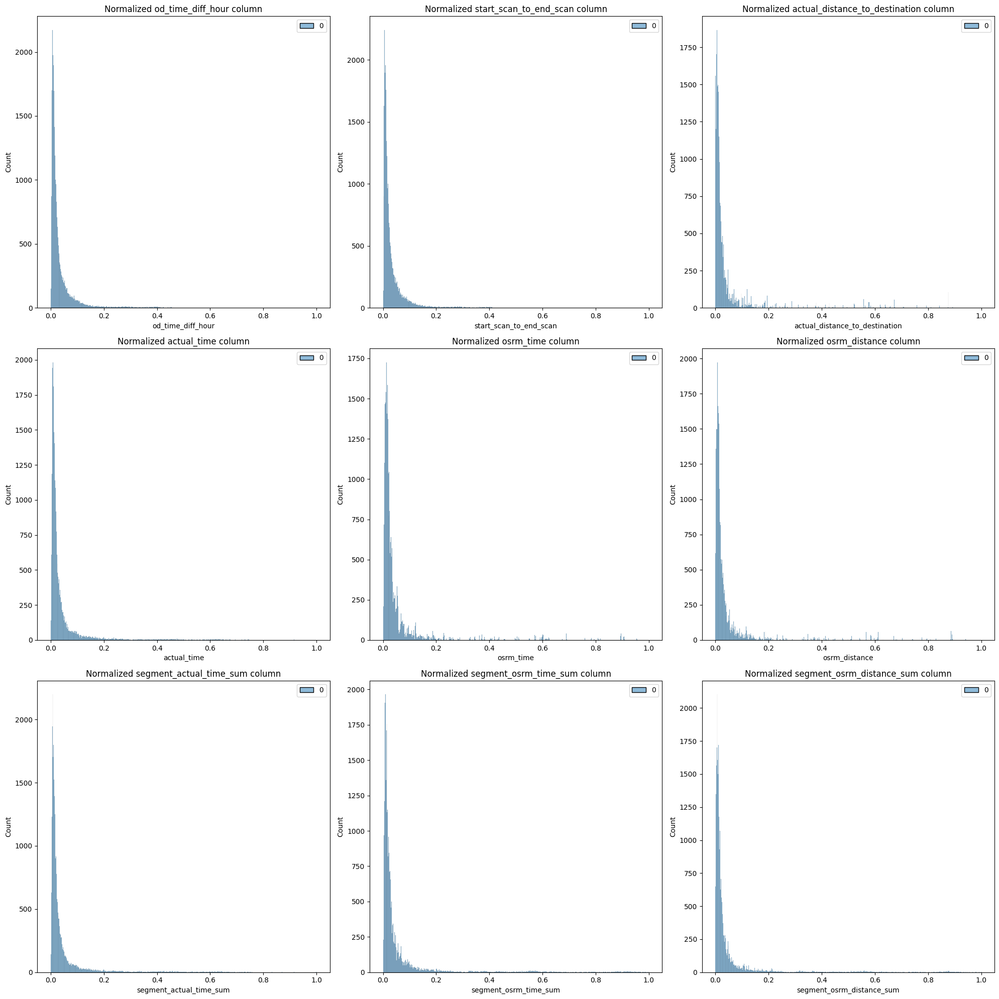

In [37]:
scaler = MinMaxScaler()

plt.figure(figsize=(20, 20))

for i, col in enumerate(n_features):
    scaled = scaler.fit_transform(df1[col].values.reshape(-1, 1))

    plt.subplot(3, 3, i + 1)
    sns.histplot(scaled)
    plt.title(f"Normalized {col} column")
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()



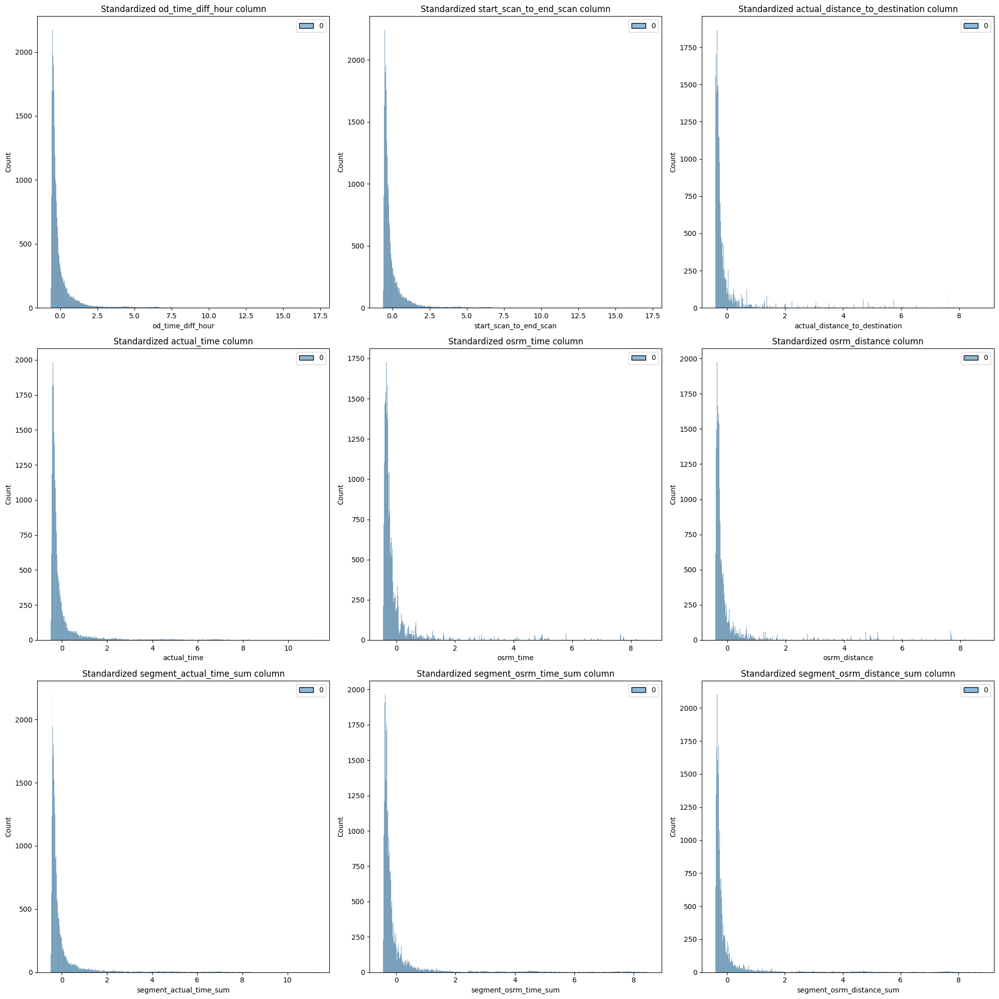

In [38]:
scaler = StandardScaler()
plt.figure(figsize=(20, 20))

for i, col in enumerate(n_features):
    scaled = scaler.fit_transform(df1[col].values.reshape(-1, 1))

    plt.subplot(3, 3, i + 1)
    sns.histplot(scaled)
    plt.title(f"Standardized {col} column")
    plt.xlabel(col)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

## Hypothesis testing

Steps to follow:
1. ___check for the conditions to be satisfied by the samples for a t-test
- Normality i.e., whether the given data is Gaussian or not
- Homogeneity of variances
2. If the conditions are met then perform t-test or else perform an equivalent test for two independent samples called ___Mann-Whitney U Rank Test___



In [39]:
## importing necessary libraries
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.graphics.gofplots import qqplot
import statsmodels.api as sm

# Function to create QQ plot
import plotly.figure_factory as ff
import plotly.graph_objects as go
import scipy.stats as stats



In [40]:
def qq_plot(data, title):
    (osm, osr), (slope, intercept, r) = stats.probplot(data, dist="norm")
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=osm, y=osr, mode='markers', name='Data'))
    fig.add_trace(go.Scatter(x=osm, y=slope*osm + intercept, mode='lines', name='Fit'))
    fig.update_layout(title=title, xaxis_title='Theoretical Quantiles', yaxis_title='Sample Quantiles')
    fig.show()

def check_normality(data, name):
    stat, p = stats.shapiro(data)
    print('-' * 50)
    print(f'Normality check for {name}')
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian')
    else:
        print('Sample does not look Gaussian')

def check_homogeneity_of_variances(data1, data2, name1, name2):
    stat, p = stats.levene(data1, data2)
    print('-' * 50)
    print(f'Homogeneity check for {name1} and {name2}')
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    alpha = 0.05
    if p > alpha:
        print('Variances are equal')
    else:
        print('Variances are not equal')
    print('-' * 50)
def mannwhitneyu_rank_test(*args):
    u_stat, p_val = stats.mannwhitneyu(*args)
    print('-' * 50)
    print('U-statistic=%.3f, p-value=%.3f' % (u_stat, p_val))
    if p_val<0.05:
        print('The samples are not similar')
        print('-' * 50)
    else:
        print('The samples are similar')
        print('-' * 50)

In [41]:
df_aggregated = df.groupby('trip_uuid').agg({
    'actual_time': 'mean',
    'osrm_time': 'mean',
    'segment_actual_time': 'mean',
    'osrm_distance': 'mean',
    'segment_osrm_distance': 'mean',
    'segment_osrm_time': 'mean'
}).reset_index()

### a. ___actual_time aggregated value___ v/s ___OSRM time aggregated value___

___Null Hypothesis:___ actual_time(time taken in real-time) and osrm_time(machine generated expected time) are same.

___Alternate Hypothesis:___ actual_time(time taken in real-time) and osrm_time(machine generated expected time) are not the same.

In [42]:
# QQ plots for the given pairs
qq_plot(df_aggregated['actual_time'], 'QQ Plot for Actual Time')
qq_plot(df_aggregated['osrm_time'], 'QQ Plot for OSRM Time')


It is evident from the above plots that the samples do not follow a Gaussian Distribution

In [43]:
# checking for normality
check_normality(df_aggregated['actual_time'], 'actual_time')
check_normality(df_aggregated['osrm_time'], 'osrm_time')

# checking for homogeneity of variances
check_homogeneity_of_variances(df_aggregated['actual_time'],df_aggregated['osrm_time'],'actual_time','osrm_time')


--------------------------------------------------
Normality check for actual_time
Statistics=0.485, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Normality check for osrm_time
Statistics=0.450, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Homogeneity check for actual_time and osrm_time
Statistics=634.540, p=0.000
Variances are not equal
--------------------------------------------------


Assumptions of T-test fail hence we perform ___Mann-Whitney U rank test___ for two independent samples.

In [44]:
mannwhitneyu_rank_test(df_aggregated['actual_time'], df_aggregated['osrm_time'])

--------------------------------------------------
U-statistic=166595067.500, p-value=0.000
The samples are not similar
--------------------------------------------------


### b. ___actual_time aggregated value___ v/s ___segment_actual_time aggregated value___

___Null Hypothesis:___ actual_time(time taken in real-time) and segment_actual_time(time taken by subset of actual_time) are same.

___Alternate Hypothesis:___ actual_time(time taken in real-time) and segment_actual_time(time taken by subset of actual_time) are not the same.

In [45]:
# QQ plots for the given pairs

qq_plot(df_aggregated['actual_time'], 'QQ Plot for Actual Time')
qq_plot(df_aggregated['segment_actual_time'], 'QQ Plot for Segment Actual Time')

In [46]:
# checking for normality
check_normality(df_aggregated['actual_time'], 'actual_time')
check_normality(df_aggregated['segment_actual_time'], 'segment_actual_time')

# checking for homogeneity of variances
check_homogeneity_of_variances(df_aggregated['actual_time'],df_aggregated['segment_actual_time'],'actual_time','segment_actual_time')

--------------------------------------------------
Normality check for actual_time
Statistics=0.485, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Normality check for segment_actual_time
Statistics=0.206, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Homogeneity check for actual_time and segment_actual_time
Statistics=1713.424, p=0.000
Variances are not equal
--------------------------------------------------


Assumptions of T-test fail hence we perform ___Mann-Whitney U rank test___ for two independent samples.

In [47]:
mannwhitneyu_rank_test(df_aggregated['actual_time'], df_aggregated['segment_actual_time'])

--------------------------------------------------
U-statistic=186134786.500, p-value=0.000
The samples are not similar
--------------------------------------------------


### c. ___OSRM distance aggregated value___ v/s ___segment OSRM distance aggregated value___

___Null Hypothesis:___ osrm_distance(machine generated expected distance) and segment_osrm_distance(machine generated distance of subset of osrm_distance) are same.

___Alternate Hypothesis:___ osrm_distance(machine generated expected distance) and segment_osrm_distance(machine generated distance of subset of osrm_distance) are not the same.

In [48]:
# QQ plots for the given pairs

qq_plot(df_aggregated['osrm_distance'], 'QQ Plot for OSRM Distance')
qq_plot(df_aggregated['segment_osrm_distance'], 'QQ Plot for Segment OSRM Distance')

In [49]:
# checking for normality
check_normality(df_aggregated['osrm_distance'], 'osrm_distance')
check_normality(df_aggregated['segment_osrm_distance'], 'segment_osrm_distance')

# checking for homogeneity of variances
check_homogeneity_of_variances(df_aggregated['osrm_distance'],df_aggregated['segment_osrm_distance'],'osrm_distance','segment_osrm_distance')

--------------------------------------------------
Normality check for osrm_distance
Statistics=0.436, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Normality check for segment_osrm_distance
Statistics=0.141, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Homogeneity check for osrm_distance and segment_osrm_distance
Statistics=1699.697, p=0.000
Variances are not equal
--------------------------------------------------


Assumptions of T-test fail hence we perform ___Mann-Whitney U rank test___ for two independent samples.

In [50]:
mannwhitneyu_rank_test(df_aggregated['osrm_distance'], df_aggregated['segment_osrm_distance'])

--------------------------------------------------
U-statistic=184061004.000, p-value=0.000
The samples are not similar
--------------------------------------------------


### d. ___OSRM time aggregated value___ v/s ___segment segment OSRM time aggregated value___

___Null Hypothesis:___ osrm_time(machine generated expected time) and segment_osrm_time(machine generated time of subset of osrm_time) are same.

___Alternate Hypothesis:___ osrm_time(machine generated expected time) and segment_osrm_time(machine generated time of subset of osrm_time) are not the same.

In [51]:
qq_plot(df_aggregated['osrm_time'], 'QQ Plot for OSRM Distance')
qq_plot(df_aggregated['segment_osrm_time'], 'QQ Plot for Segment OSRM Distance')

In [52]:
# checking for normality
check_normality(df_aggregated['osrm_time'], 'osrm_time')
check_normality(df_aggregated['segment_osrm_time'], 'segment_osrm_time')

# checking for homogeneity of variances
check_homogeneity_of_variances(df_aggregated['osrm_time'],df_aggregated['segment_osrm_time'],'osrm_time','segment_osrm_time')


--------------------------------------------------
Normality check for osrm_time
Statistics=0.450, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Normality check for segment_osrm_time
Statistics=0.172, p=0.000
Sample does not look Gaussian
--------------------------------------------------
Homogeneity check for osrm_time and segment_osrm_time
Statistics=1792.235, p=0.000
Variances are not equal
--------------------------------------------------


Assumptions of T-test fail hence we perform ___Mann-Whitney U rank test___ for two independent samples.

In [53]:
mannwhitneyu_rank_test(df_aggregated['osrm_time'], df_aggregated['segment_osrm_time'])

--------------------------------------------------
U-statistic=187393886.000, p-value=0.000
The samples are not similar
--------------------------------------------------


___Observing patterns and inference___

-   Checking most orders created from states and cities
-   Checking most trips ended in states and cities

In [54]:
df_source_state=df1.groupby(by='source_state')['trip_uuid'].count().to_frame().reset_index()
df_source_state['percentage']= np.round(df_source_state['trip_uuid']*100/df_source_state['trip_uuid'].sum(),2)
df_source_state=df_source_state.sort_values(by='trip_uuid',ascending=False)
df_source_state.head()

,source_state,trip_uuid,percentage
17,maharashtra,3565,13.60
14,karnataka,3445,13.14
25,tamil nadu,2130,8.12
10,haryana,2039,7.78
28,uttar pradesh,1818,6.93


In [55]:
fig = px.bar(df_source_state,
             x='trip_uuid',
             y='source_state',
             color='source_state',
             title="Number of trips created from different states",
             labels={'trip_uuid': 'Trip UUID', 'source_state': 'Source State'})

# Update layout for better visualization
fig.update_layout(height=800, width=1100)

# Show the plot
fig.show()

In [56]:
df_source_city=df1.groupby(by='source_city')['trip_uuid'].count().to_frame().reset_index()
df_source_city['percentage']= np.round(df_source_city['trip_uuid']*100/df_source_city['trip_uuid'].sum(),2)
df_source_city=df_source_city.sort_values(by='trip_uuid',ascending=False)[:50]
df_source_city.head()

,source_city,trip_uuid,percentage
136,bengaluru,1136,4.33
421,gurgaon,1130,4.31
168,bhiwandi,821,3.13
99,bangalore,792,3.02
781,mumbai,719,2.74


In [57]:
fig = px.bar(df_source_city,
             x='trip_uuid',
             y='source_city',
             color='source_city',
             title="Number of trips created from different cities",
             labels={'trip_uuid': 'Trip UUID', 'source_city': 'Source City'})

# Update layout for better visualization
fig.update_layout(height=1100, width=1100)

# Show the plot
fig.show()

In [58]:
df_destination_sate=df1.groupby(by='destination_state')['trip_uuid'].count().to_frame().reset_index()
df_destination_sate['percentage']= np.round(df_destination_sate['trip_uuid']*100/df_destination_sate['trip_uuid'].sum(),2)
df_destination_sate=df_destination_sate.sort_values(by='trip_uuid',ascending=False)
df_destination_sate.head()

,destination_state,trip_uuid,percentage
15,karnataka,3497,13.34
18,maharashtra,3473,13.24
26,tamil nadu,2111,8.05
11,haryana,2014,7.68
29,uttar pradesh,1828,6.97


In [59]:
fig = px.bar(df_destination_sate,
             x='trip_uuid',
             y='destination_state',
             color='destination_state',
             title="Number of trips ended in different states",
             labels={'trip_uuid': 'Trip UUID', 'destination_state': 'Destination State'})

# Update layout for better visualization
fig.update_layout(height=900, width=1000)

# Show the plot
fig.show()

In [60]:
df_destination_city=df1.groupby(by='destination_city')['trip_uuid'].count().to_frame().reset_index()
df_destination_city['percentage']= np.round(df_destination_city['trip_uuid']*100/df_destination_city['trip_uuid'].sum(),2)
df_destination_city=df_destination_city.sort_values(by='trip_uuid',ascending=False)[:50]
df_destination_city.head()

,destination_city,trip_uuid,percentage
139,bengaluru,1180,4.50
775,mumbai,1000,3.81
416,gurgaon,986,3.76
103,bangalore,683,2.60
460,hyderabad,643,2.45


In [61]:
fig = px.bar(df_destination_city,
             x='trip_uuid',
             y='destination_city',
             color='destination_city',
             title="Number of trips ended in different cities",
             labels={'trip_uuid': 'Trip UUID', 'destination_city': 'Destination City'})

# Update layout for better visualization
fig.update_layout(height=1100, width=1100)

# Show the plot
fig.show()

In [62]:
df1[['actual_time','osrm_time']].describe()

,actual_time,osrm_time
count,26222.000000,26222.000000
mean,200.926588,90.785333
std,385.730908,185.554359
min,9.000000,6.000000
25%,51.000000,25.000000
50%,84.000000,39.000000
75%,167.000000,72.000000
max,4532.000000,1686.000000


___Business Insights___


- The majority of orders originate from states such as Maharashtra, Karnataka, Haryana, Tamil Nadu, and Telangana, indicating strong demand in these regions.
- Mumbai leads as the top city for trip origins, followed closely by Gurgaon, Bengaluru, and Bhiwandi. This suggests a robust seller presence in these cities.
- In terms of trip destinations, Maharashtra, Karnataka, Haryana, Tamil Nadu, and Uttar Pradesh stand out, indicating high order volumes in these states.
- Similarly, Mumbai, Bengaluru, Gurgaon, Delhi, and Chennai emerge as top destinations for trips, indicating significant order placements in these cities.
- Key cities driving orders based on destination include Bengaluru, Mumbai, Gurgaon, Bangalore, and Delhi.

By understanding these insights, the business team can tailor their strategies to capitalize on the demand hotspots and effectively target their marketing efforts to maximize sales and growth potential.

#### ___Recommendations and Actionable items___

___The OSRM trip planning system needs to be improved for the following reasons:___
- Features actual_time & osrm_time are statistically different.
- Features osrm_distance and segment_osrm_distance are statistically different from each other.

___osrm_time and actual_time are different___. Team needs to make sure this difference is reduced, for better delivery time prediction and convenience for the customer to expect an accurate delivery time, which increase customer satisfaction.

___After implementing an accurate OSRM system___, making sure that the delivery person follows the same pre-defined routes for delivery becomes important for faster delivery and customer satisfaction.

___In depth Customer Profiling and segmentation___ has to be done orders for orders coming from the top states Maharashtra, Karnataka, Haryana etc., to improve customers' delivery experience